<a href="https://colab.research.google.com/github/Potdooshami/2H_TaSe2_Tc_STM/blob/main/Test_read_gwyd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Load GWY

In [1]:
!pip install gwyfile

In [2]:
fn = '/content/drive/MyDrive/2Hphase/test_py.gwy'

In [3]:
import gwyfile
import numpy as np

# gwy 파일 열기
container = gwyfile.load(fn)

# 모든 데이터 출력
for key in container.keys():
    print(key)

# 예: 첫 번째 데이터 채널 추출
data = container['/0/data']  # channel 0의 데이터

# numpy 배열로 가져오기
array = data['data']

# 확인
print(array.shape)


/0/base/range-type
/0/data
/0/data/log
/0/data/title
/0/data/view/relative-size
/0/data/view/scale
/0/data/visible
/0/meta
/0/select/rectangle
/1/data
/1/data/log
/1/data/title
/1/meta
/2/data
/2/data/log
/2/data/title
/2/meta
/3/data
/3/data/log
/3/data/title
/3/meta
/filename
(4194304,)


In [4]:
container['/0/meta']

GwyContainer([('Acquistion time', '4195 s'),
              ('Bias', '-0.4 V'),
              ('Comment',
               '1st alphabet:b Sample:2H0611_Lee STM: LT Tip: PtIr (It is same with a)  2nd,3rd alphabet:c Optical: Landing0616 Motor: (0,0) + (500,0) + (1000,0) +120K +110K +79K + (0,1000)+(1000,0) +85K+110K+  (0,-1000) +  (1000,0) +(-1000,0) +(-2000,0)+78K+115K+118K +120K 78K  Comment:s s'),
              ('Date', '01.07.2025'),
              ('Direction', 'down'),
              ('File name',
               'Z:\\Haeryong Park\\2H-TaSe2\\2HTaSe2_bab_78K052.sxm'),
              ('NanonisMain::Animations Period (s)', '20E-3'),
              ('NanonisMain::Indicators Period (s)', '300E-3'),
              ('NanonisMain::Measurements Period (s)', '500E-3'),
              ('NanonisMain::RT Frequency (Hz)', '10E+3'),
              ('NanonisMain::RT Release', '7248'),
              ('NanonisMain::SW Version', 'Generic 4.5'),
              ('NanonisMain::Session Path', 'Z:\\Haeryong Park\\2

In [5]:
container['/1/data']['data'].shape
container['/1/data']

GwyDataField([('xres', 2048),
              ('yres', 2048),
              ('xreal', 8e-08),
              ('yreal', 8e-08),
              ('xoff', -9.158612000000001e-07),
              ('yoff', 1.109547e-06),
              ('si_unit_xy', GwySIUnit([('unitstr', 'm')])),
              ('si_unit_z', GwySIUnit([('unitstr', 'm')])),
              ('data',
               array([-9.42724796e-08, -9.42733465e-08, -9.42713214e-08, ...,
                      -9.39620790e-08, -9.39629743e-08, -9.39657880e-08]))])

Transform into np.array

(-1.3e-11, 1.8e-11)
(-1.3e-11, 1.8e-11)


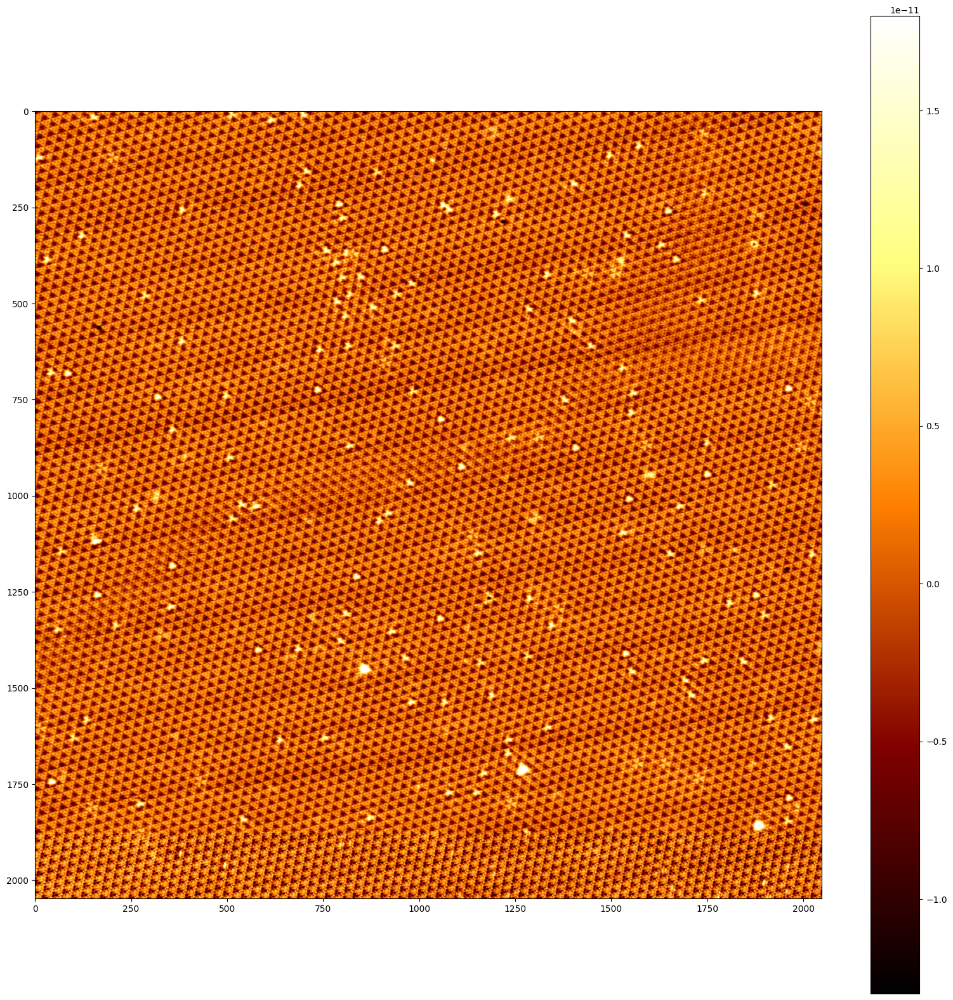

In [6]:
p = (10**(-12))
arr = container['/0/data']['data']
arr = arr.reshape(2048,2048)
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 20)) # Adjust the size as needed
img = plt.imshow(arr,cmap='afmhot',vmin=-13*p,vmax=18*p)
plt.colorbar()

print(img.get_clim())
img.set_clim(-13*p,18*p)
print(img.get_clim())

# Preprocessing(Leveling)

In [7]:
arr

array([[ 4.44493188e-12,  2.91136358e-12,  3.82213127e-12, ...,
         2.61197941e-13, -9.79377054e-13, -4.65001106e-13],
       [-6.52017983e-12, -8.52980451e-12, -7.57639731e-12, ...,
        -1.84788204e-13, -2.91039314e-12, -1.30177674e-12],
       [-7.90985624e-12, -6.94940503e-12, -8.11340825e-12, ...,
         8.72895178e-13,  5.77350773e-13,  3.89127437e-12],
       ...,
       [ 1.48534338e-12,  2.51982407e-12,  7.26536926e-13, ...,
         1.03785298e-12,  4.95334109e-12,  3.51842142e-12],
       [ 9.35193731e-13,  1.57885768e-12,  2.46429883e-12, ...,
         1.10124173e-12,  6.60834571e-12,  4.34209100e-12],
       [ 8.97706220e-13, -3.07717587e-12,  3.30784823e-12, ...,
         8.31746449e-13,  2.93535088e-12,  1.03857834e-12]])

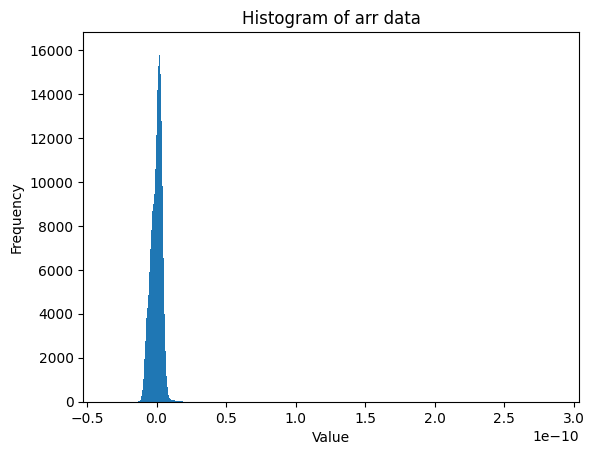

In [8]:
plt.hist(arr.flatten(), bins=10000)
plt.title('Histogram of arr data')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

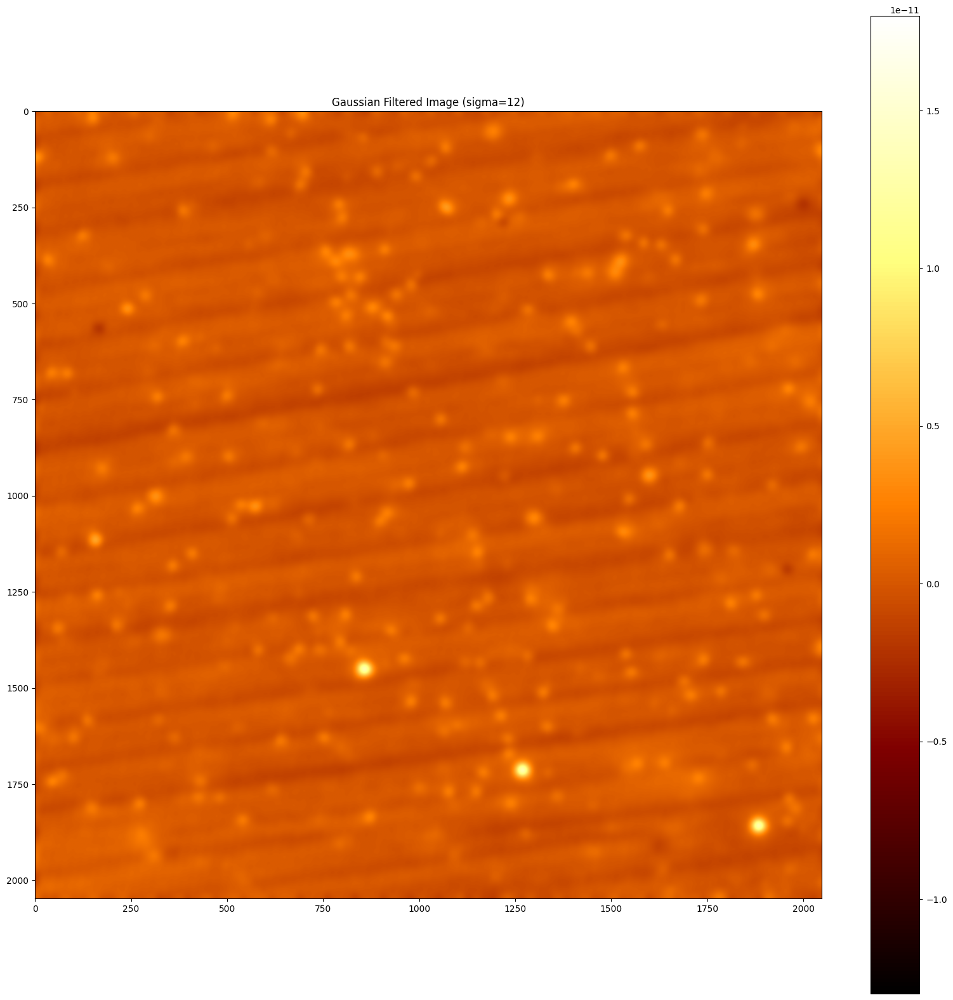

In [9]:
from scipy.ndimage import gaussian_filter

# Apply Gaussian filter
# Adjust sigma as needed for the desired amount of smoothing
sigma = 12  # Example sigma value
arr_filtered = gaussian_filter(arr, sigma=sigma)

# You can then visualize the filtered image
plt.figure(figsize=(20, 20))
plt.imshow(arr_filtered, cmap='afmhot', vmin=-13*p, vmax=18*p)
plt.colorbar()
plt.title(f'Gaussian Filtered Image (sigma={sigma})')
plt.show()

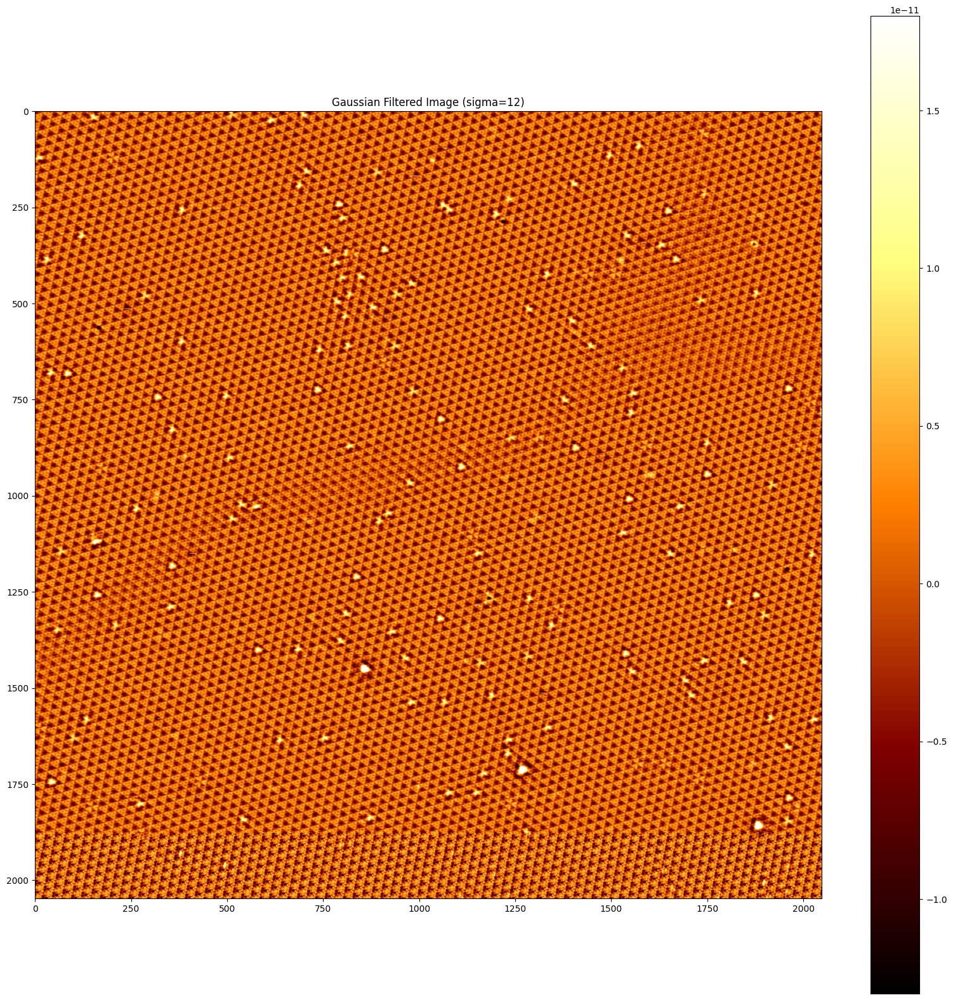

In [10]:
sigma = 12  # Example sigma value
arr_filtered = gaussian_filter(arr, sigma=sigma)
aff_br = arr - arr_filtered #background removed
# You can then visualize the filtered image
plt.figure(figsize=(20, 20))
plt.imshow(aff_br, cmap='afmhot', vmin=-13*p, vmax=18*p)
plt.colorbar()
plt.title(f'Gaussian Filtered Image (sigma={sigma})')
plt.show()

# FFT peaks find

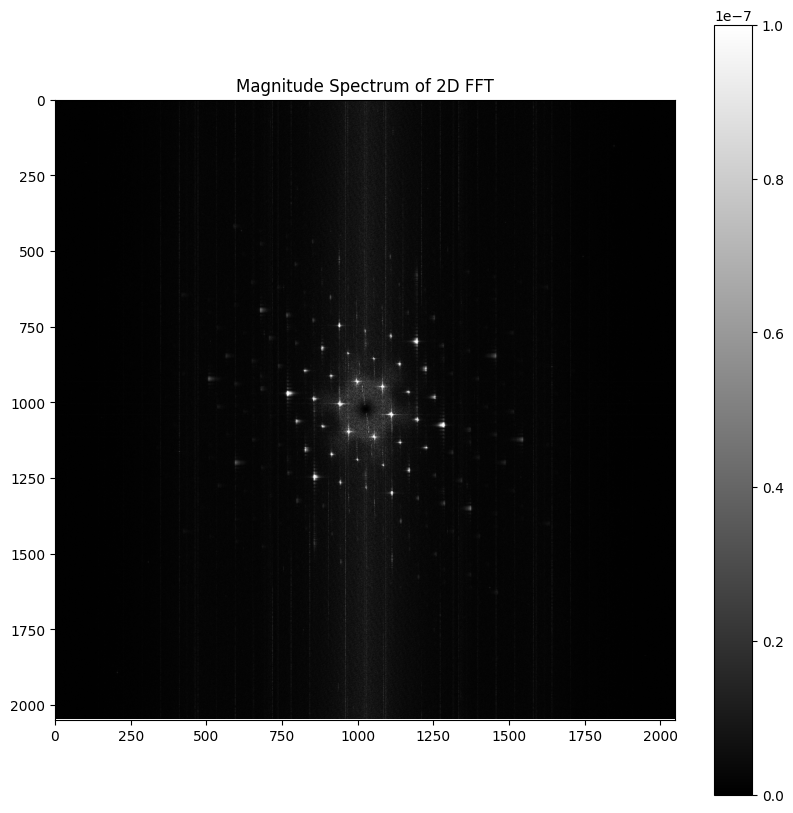

In [11]:
from scipy.fft import fft2, fftshift

# Compute the 2D FFT
fft_result = fft2(aff_br)

# Shift the zero-frequency component to the center
fft_result_shifted = fftshift(fft_result)

# Compute the magnitude spectrum (absolute value)
magnitude_spectrum = np.abs(fft_result_shifted)

# Visualize the magnitude spectrum
plt.figure(figsize=(10, 10))

# Use log scale for better visualization
log_magnitude_spectrum = np.log(magnitude_spectrum + 1)

# --- Adjust vmin and vmax here ---
# You can inspect the histogram of log_magnitude_spectrum to find appropriate limits
# plt.hist(log_magnitude_spectrum.flatten(), bins=100)
# plt.show()

vmin = 0 # Example lower limit - Adjust this value
vmax = 0.0000001 # Example upper limit - Adjust this value
# ---------------------------------


plt.imshow(log_magnitude_spectrum, cmap='gray', vmin=vmin, vmax=vmax)
plt.title('Magnitude Spectrum of 2D FFT')
plt.colorbar()
plt.show()

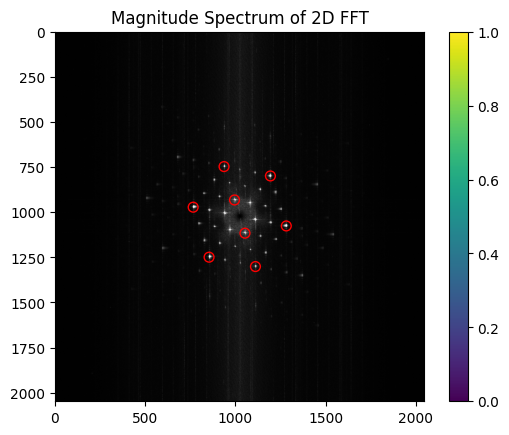

In [12]:
from skimage.feature import peak_local_max
coordinates = peak_local_max(log_magnitude_spectrum, min_distance=100, threshold_abs=.0000002)
#print(coordinates)
plt.imshow(log_magnitude_spectrum, cmap='gray', vmin=vmin, vmax=vmax)
plt.scatter(coordinates[:, 1], coordinates[:, 0], s=50, facecolors='none', edgecolors='r')
plt.title('Magnitude Spectrum of 2D FFT')
plt.colorbar()
plt.show()

In [13]:
coordinates

array([[ 932,  995],
       [1116, 1053],
       [ 747,  937],
       [1301, 1111],
       [ 799, 1194],
       [1249,  854],
       [ 972,  766],
       [1076, 1282]])

In [14]:
average_coordinates = np.mean(coordinates, axis=0)
average_coordinates

array([1024., 1024.])

In [15]:
# Subtract the column-wise average from the coordinates
centered_coordinates = coordinates - average_coordinates

print("Coordinates after subtracting column-wise average:")
print(centered_coordinates)#0,1 remove

Coordinates after subtracting column-wise average:
[[ -92.  -29.]
 [  92.   29.]
 [-277.  -87.]
 [ 277.   87.]
 [-225.  170.]
 [ 225. -170.]
 [ -52. -258.]
 [  52.  258.]]


In [16]:
k1 = centered_coordinates[2]/3


In [17]:
def generate_sine_wave_from_k(k_value,  arr_shape,phi=0):
  """
  Generates a 2D sine wave based on a k-value (spatial frequency vector).

  Args:
    k_value: A 2-element numpy array representing the centered k-vector
             (ky_c, kx_c) in pixel units from the FFT.
    arr_shape: A tuple (image_height, image_width) representing the shape
               of the desired output image in pixels.
    phi: Optional phase offset in radians. Defaults to 0.

  Returns:
    A 2D numpy array representing the sine wave.
  """
  # Get the centered k-vector components
  ky_c = k_value[0]
  kx_c = k_value[1]
  image_height, image_width = arr_shape
  # Create a grid of spatial coordinates (pixel indices)
  y_indices, x_indices = np.indices((image_height, image_width))

  # Calculate spatial frequencies in cycles per pixel
  spatial_freq_x_cpp = kx_c / image_width
  spatial_freq_y_cpp = ky_c / image_height

  # Construct the full argument for the sine wave, including the 2*pi factor and phase
  argument = 2 * np.pi * (spatial_freq_x_cpp * x_indices + spatial_freq_y_cpp * y_indices) + phi

  # Generate the sine wave
  sine_wave = np.sin(argument)

  return sine_wave

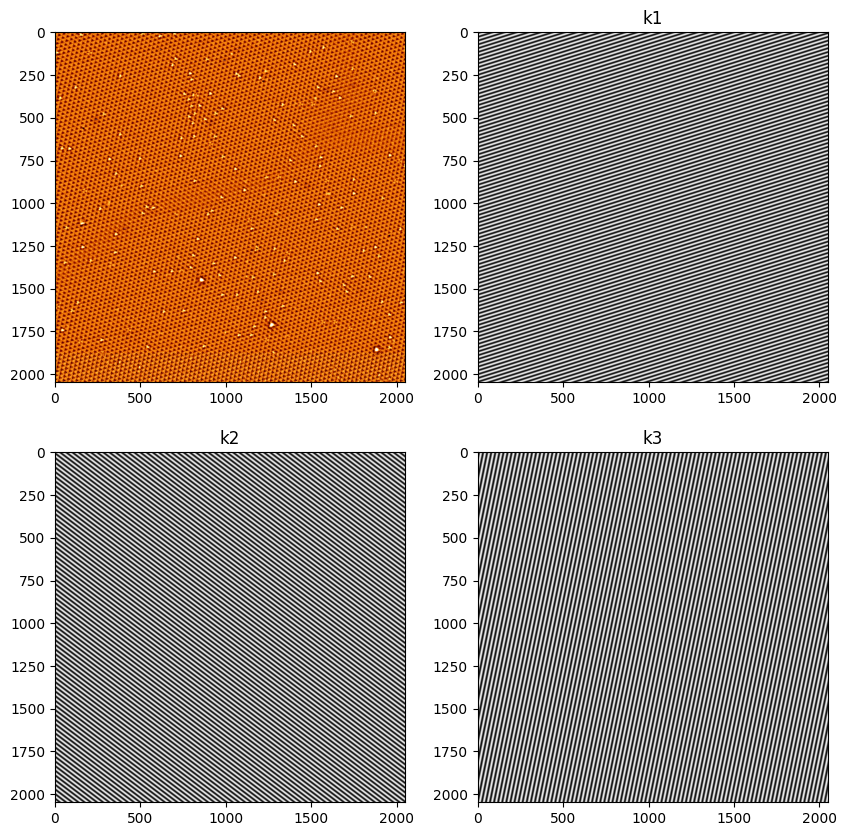

In [45]:
fig,axs = plt.subplots(2,2,figsize=(10, 10))
axs[0,0].imshow(aff_br, cmap='afmhot', vmin=-13*p, vmax=18*p)


iks = [2,4,6]
isbs = [0,1,1]
jsbs = [1,0,1]
tns = ['k1','k2','k3']
for ik,isb,jsb,tn in zip(iks,isbs,jsbs,tns):
  k = centered_coordinates[ik]/3
  sinimg = generate_sine_wave_from_k(k, aff_br.shape)
  axs[isb,jsb].imshow(sinimg, cmap='gray')
  axs[isb,jsb].set_title(tn)

# One shot trial... but not works...

In [19]:
def auto_clim(data, method='percentile', lower=1, upper=99):
    """
    data: 2D array
    method: 'percentile' or 'std'
    """
    if method == 'percentile':
        vmin, vmax = np.percentile(data, [lower, upper])
    elif method == 'std':
        mean = np.mean(data)
        std = np.std(data)
        vmin, vmax = mean - std, mean + std
    else:
        raise ValueError("method must be 'percentile' or 'std'")
    return vmin, vmax


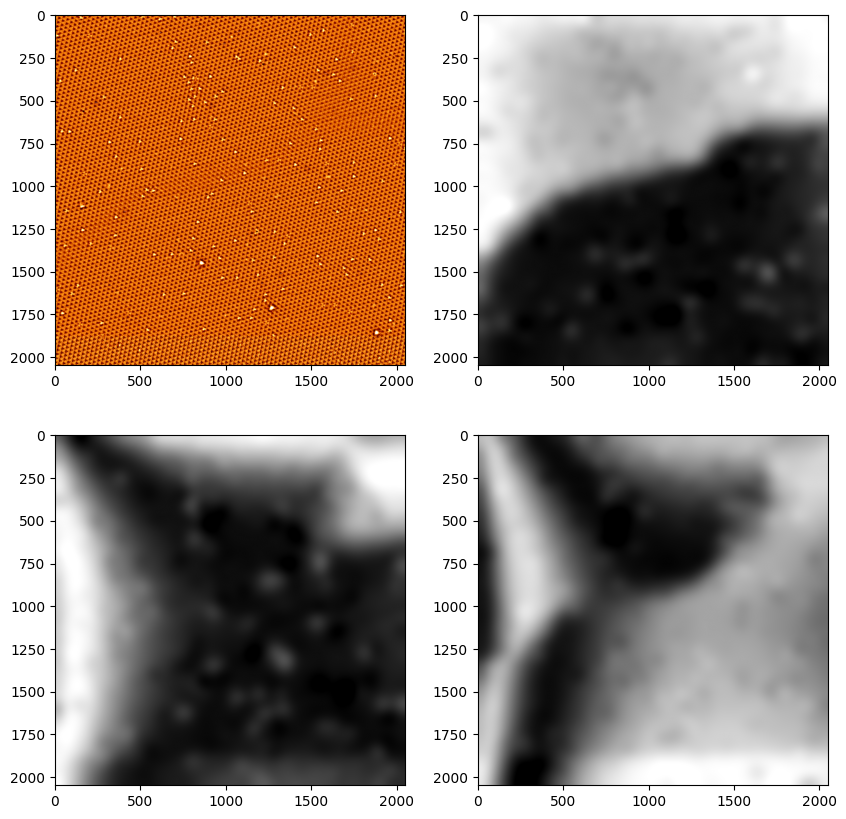

In [20]:
fig,axs = plt.subplots(2,2,figsize=(10, 10))
axs[0,0].imshow(aff_br, cmap='afmhot', vmin=-13*p, vmax=18*p)


iks = [2,4,6]
isbs = [0,1,1]
jsbs = [1,0,1]

for ik,isb,jsb in zip(iks,isbs,jsbs):
  k = centered_coordinates[ik]
  sinimg_atom = generate_sine_wave_from_k(k, aff_br.shape,0)
  sinprod_atom = sinimg_atom * aff_br
  sinprod_atom = gaussian_filter(sinprod_atom,40)
  sinimg_CDW = generate_sine_wave_from_k(k/3, aff_br.shape,0)
  sinprod_CDW = sinimg_CDW*aff_br
  sinprod_CDW = gaussian_filter(sinprod_CDW,40)
  #sinprod_CDW_rm = sinprod_CDW-sinprod_atom
  sinprod_CDW_rm = sinprod_CDW
  #sinprod_CDW_rm = sinprod_atom
  vmin, vmax = auto_clim(sinprod_CDW_rm, method='percentile', lower=1, upper=99)
  axs[isb,jsb].imshow(sinprod_CDW_rm, cmap='gray', vmin=vmin, vmax=vmax)

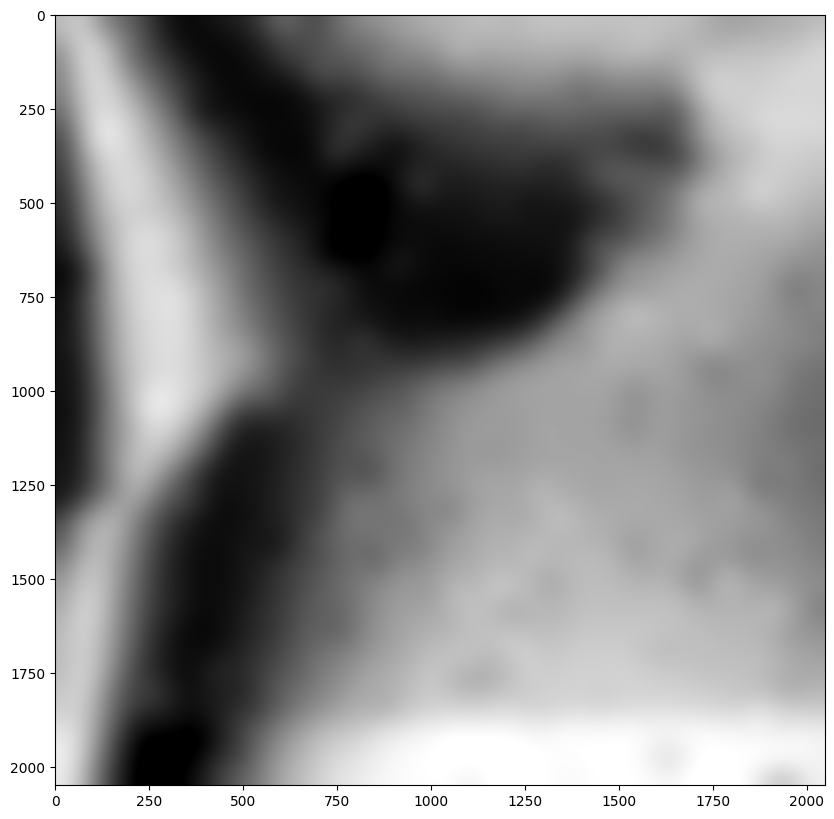

In [21]:
plt.figure(figsize=(10, 10))
plt.imshow(sinprod_CDW_rm, cmap='gray', vmin=vmin, vmax=vmax)

# Okay, let's do it step-by-step

phase recovery first

In [22]:
ks = centered_coordinates[[2,4,6]]
ks

array([[-277.,  -87.],
       [-225.,  170.],
       [ -52., -258.]])

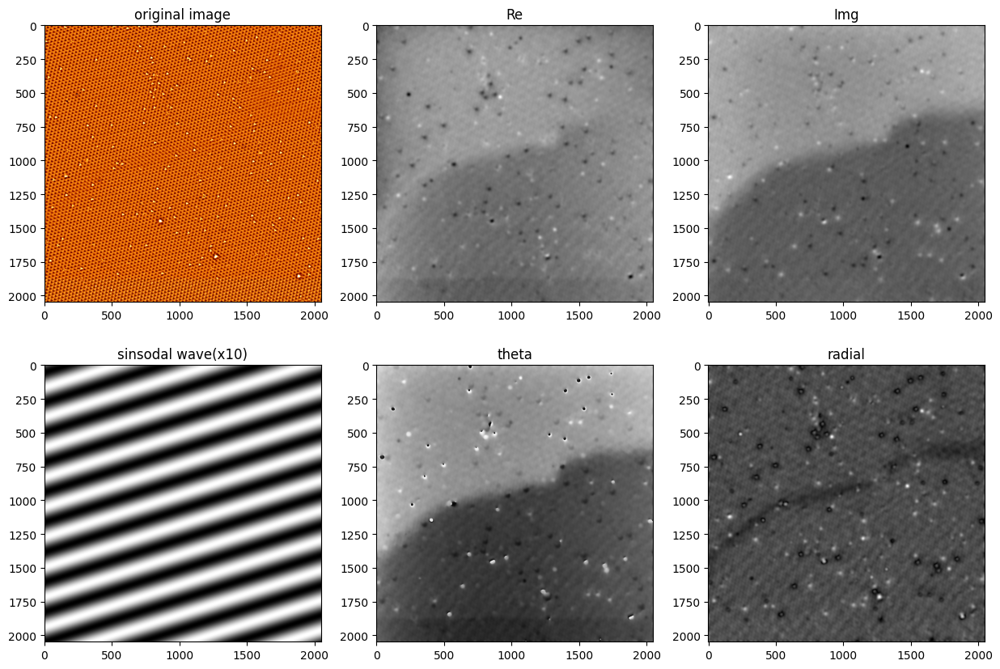

In [23]:
from os import supports_dir_fd
ik = 0

fig,axs = plt.subplots(2,3,figsize=(15, 10))
axs[0,0].imshow(aff_br, cmap='afmhot', vmin=-13*p, vmax=18*p)
axs[0,0].set_title('original image')

k = ks[ik]/3
sw = generate_sine_wave_from_k(k/10,  aff_br.shape,0)
axs[1,0].imshow(sw, cmap='gray')
axs[1,0].set_title('sinsodal wave(x10)')

sw = generate_sine_wave_from_k(k,  aff_br.shape,0)
cw = generate_sine_wave_from_k(k,  aff_br.shape,np.pi/2)
sprod = gaussian_filter(sw*aff_br,10)
cprod = gaussian_filter(cw*aff_br,10)
xprox = cprod +sprod*1j

tns = ['Re','Img','theta','radial']
isbs = [0,0,1,1]
jsbs = [1,2,1,2]
funcs = [np.real, np.imag, np.angle, np.abs]

for isb,jsb,func,tn in zip(isbs,jsbs,funcs,tns):
  reimg = func(xprox)
  axs[isb,jsb].imshow(reimg, cmap='gray')
  axs[isb,jsb].set_title(tn)

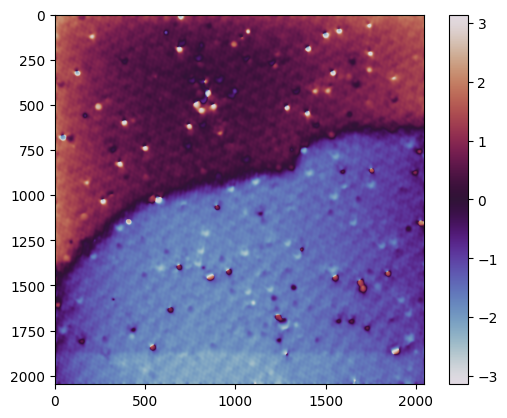

In [24]:
reimg = np.angle(xprox)
im = plt.imshow(reimg,cmap='twilight')
#im = plt.imshow(reimg,cmap='hsv')
plt.colorbar(im)

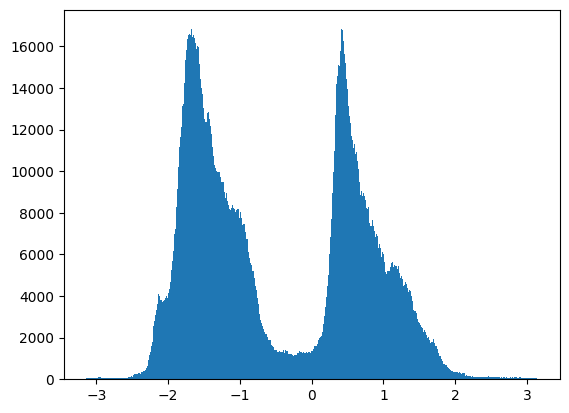

In [25]:
reimg = np.angle(xprox)
plt.hist(reimg.flatten(),bins=1000);

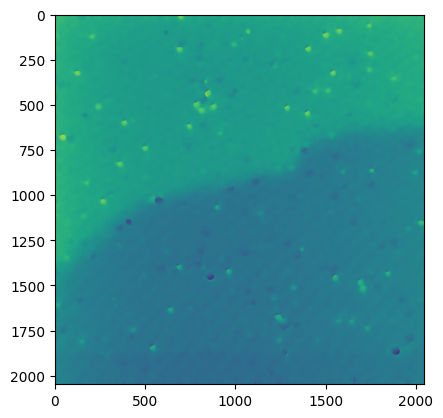

In [26]:
from skimage.restoration import unwrap_phase
reimg = unwrap_phase(reimg)
plt.imshow(reimg)

# Remove extrinsic displacement


In [27]:
def kdispacementmap(arr,k,sig):
  sw = generate_sine_wave_from_k(k,  arr.shape,0)
  cw = generate_sine_wave_from_k(k,  arr.shape,np.pi/2)
  sprod = gaussian_filter(sw*arr,sig)
  cprod = gaussian_filter(cw*arr,sig)
  xprod = cprod +sprod*1j
  return xprod
# def kdispacementmaps(arr,ks,sig):
#   xprods_shape = list(arr.shape);xprods_shape.append(len(ks))
#   xprods = np.zeros(xprods_shape)
#   ik = 0
#   for k in ks:
#     xprods[:,:,ik] = kdispacementmap(arr,k,sig)
#     #xprods.append(xprod)
#     ik+=1
#     return xprods
def visxprod(xprod):
  fig,axs = plt.subplots(2,2,figsize=(10, 10))

  #sw = generate_sine_wave_from_k(k,  aff_br.shape,0)
  tns = ['Re','Img','theta','radial']
  isbs = [0,0,1,1]
  jsbs = [0,1,0,1]
  funcs = [np.real, np.imag, np.angle, np.abs]
  cmaps = ['PuOr','vanimo','twilight','plasma']
  for isb,jsb,func,tn,cmap in zip(isbs,jsbs,funcs,tns,cmaps):
    reimg = func(xprod)
    #if tn == 'theta':
     # reimg = unwrap_phase(reimg)
    #else:
    vmin,vmax = auto_clim(reimg, method='percentile')
    im = axs[isb,jsb].imshow(reimg, cmap=cmap,vmin=vmin,vmax=vmax)
    plt.colorbar(im, ax=axs[isb,jsb])
    axs[isb,jsb].set_title(tn)
    axs[isb,jsb].set_xticks([])
    axs[isb,jsb].set_yticks([])
  return fig, axs
def auto_clim(data, method='percentile', lower=1, upper=99):
  """
  data: 2D array
  method: 'percentile' or 'std'
  """
  if method == 'percentile':
      vmin, vmax = np.percentile(data, [lower, upper])
  elif method == 'std':
      mean = np.mean(data)
      std = np.std(data)
      vmin, vmax = mean - std, mean + std
  else:
      raise ValueError("method must be 'percentile' or 'std'")
  return vmin, vmax
def get_symmetric_clim_by_percentile(data, percentile):
  """
  Calculates symmetric vmin and vmax for a 2D array based on a percentile.

  Args:
    data: A 2D numpy array.
    percentile: The desired percentile (0-100) of data to be included
                between vmin and vmax.

  Returns:
    A tuple (vmin, vmax) where abs(vmin) == abs(vmax) and the data
    between vmin and vmax is the specified percentile.
  """
  if not 0 <= percentile <= 100:
    raise ValueError("Percentile must be between 0 and 100")

  # Calculate the lower and upper percentile values
  lower_percentile = (100 - percentile) / 2
  upper_percentile = 100 - lower_percentile

  # Get the data values at these percentiles
  vmin_initial, vmax_initial = np.percentile(data, [lower_percentile, upper_percentile])

  # Ensure symmetric vmin and vmax with the largest absolute value
  max_abs = max(abs(vmin_initial), abs(vmax_initial))
  vmin = -max_abs
  vmax = max_abs

  return vmin, vmax

In [47]:
ks

array([[-277.,  -87.],
       [-225.,  170.],
       [ -52., -258.]])

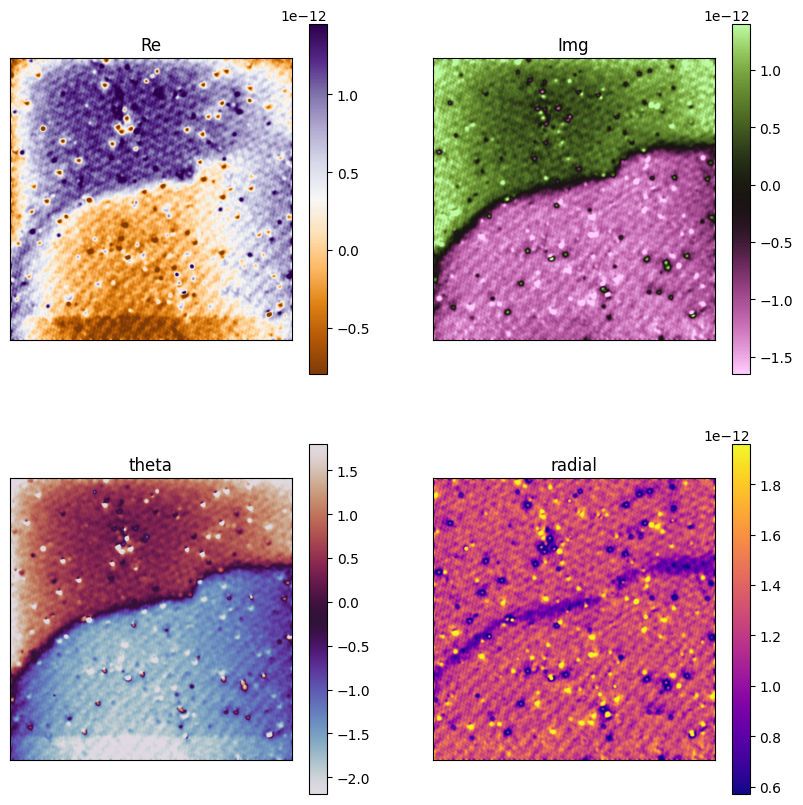

In [46]:
tns = ['k1','k2','k3']
arr = aff_br
ik=0;k = ks[ik]/3
sig = 10
xprod = kdispacementmap(arr,k,sig)
fig,axs = visxprod(xprod)

In [29]:
ik=0
k = ks[ik]/3
xprods = kdispacementmap(aff_br,k,10)
xprod_atom=[]
xprod_CDW=[]



xyShape = list(aff_br.shape);print(xyShape);xyShape.append(3);xyShape.append(2)
xprodss = np.zeros(xyShape, dtype=complex)
for ik in range(3):
  k = ks[ik]
  xprodss[:,:,ik,0] = kdispacementmap(aff_br,k,10)
  xprodss[:,:,ik,1] = kdispacementmap(aff_br,k/3,10)

[2048, 2048]


In [30]:
foo = list(xprodss.shape)
foo[-1] = 3
foo
angless_unwrapped = np.zeros(foo)
angless_unwrapped[:,:,:,0] = np.angle(xprodss[:,:,:,0])
angless_unwrapped[:,:,:,1] = np.angle(xprodss[:,:,:,1])
for ik in range(3):
  angless_unwrapped[:,:,ik,0] = unwrap_phase(angless_unwrapped[:,:,ik,0])
  angless_unwrapped[:,:,ik,1] = unwrap_phase(angless_unwrapped[:,:,ik,1])


In [31]:
angless_unwrapped[:,:,:,2] = angless_unwrapped[:,:,:,1] - angless_unwrapped[:,:,:,0]/3
#xprodss_wrapped = np.zeros(xprodss_unwrapped.shape)

In [32]:
def wrap_phase(unwrapped_phase):
  """
  Wraps unwrapped phase data into the range of (-pi, pi].

  Args:
    unwrapped_phase: A numpy array containing the unwrapped phase data.

  Returns:
    A numpy array containing the wrapped phase data.
  """
  wrapped_phase = np.mod(unwrapped_phase + np.pi, 2 * np.pi) - np.pi
  return wrapped_phase

final print

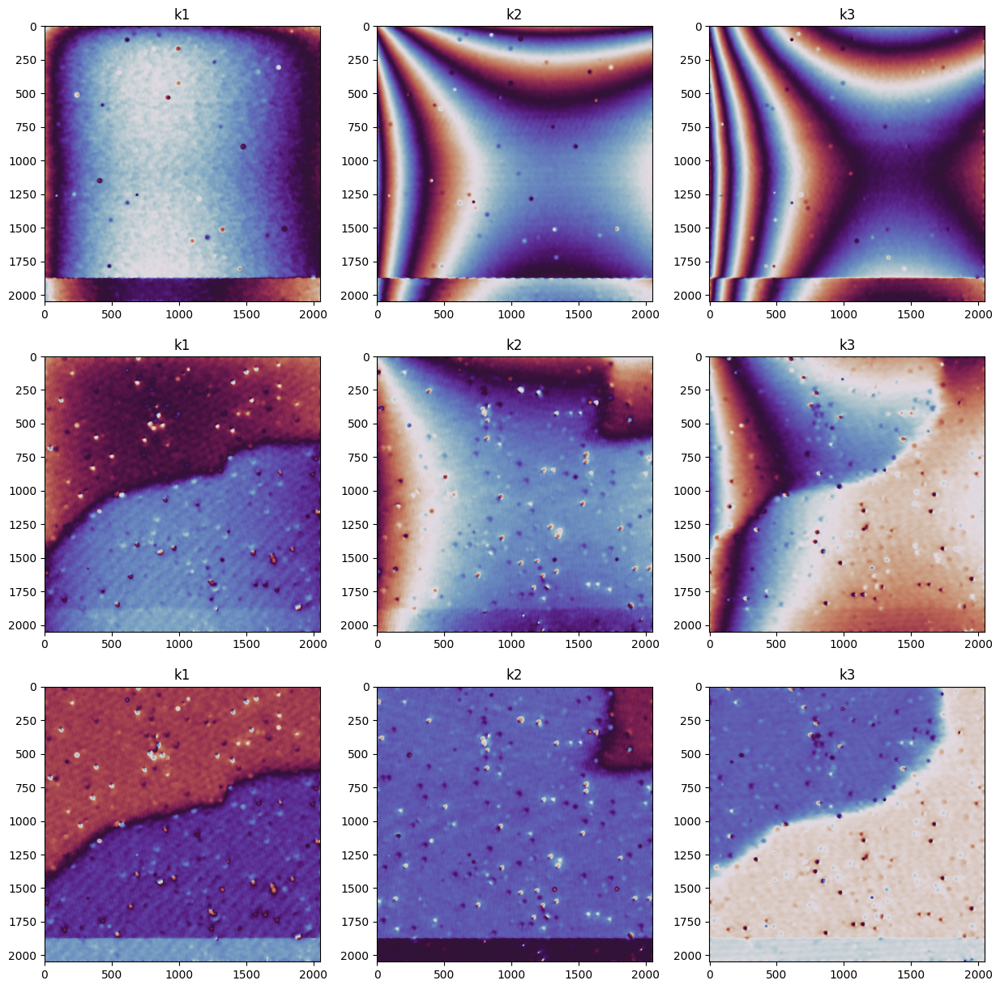

In [33]:

fig,axs = plt.subplots(3,3,figsize=(15, 15))
tns = ['k1','k2','k3']
yns = ['CDW','atom','CDW_compensate']

for ik,tn in zip(range(3),tns):
  for iT,yn in zip(range(3),yns):
    reimg = angless_unwrapped[:,:,ik,iT]
    reimg = wrap_phase(reimg)
    #print(max(reimg))
    #print(min(reimg))
    axs[iT,ik].imshow(reimg, cmap='twilight')
    #vmin,vmax = auto_clim(reimg, method='percentile')
    axs[iT,ik].set_title(tn)
  # xprod_atom = xprodss[:,:,ik,0]
  # xprod_CDW = xprodss[:,:,ik,1]
  # angle_atom = np.angle(xprod_atom)
  # angle_CDW = np.angle(xprod_CDW)
  # axs[0,ik].set_title(tn)
  # axs[0,ik].set_title(tn)

  # Add your plotting or analysis logic here, e.g.,
  # axs[0, ik].imshow(np.real(xprod_CDW), cmap='gray')
  # axs[1, ik].imshow(np.imag(xprod_CDW), cmap='gray')
  # axs[2, ik].imshow(angle_CDW, cmap='twilight')

Two additional things to do  
1) potential shift
2) tip change compensation

In [34]:
# potential shift
for ik in range(3):
  iT = 2
  angless_unwrapped[:,:,ik,iT] = angless_unwrapped[:,:,ik,iT] - angless_unwrapped[0:500,0:500,ik,iT].mean()



Text(0.5, 0.98, 'displacement field-phase')

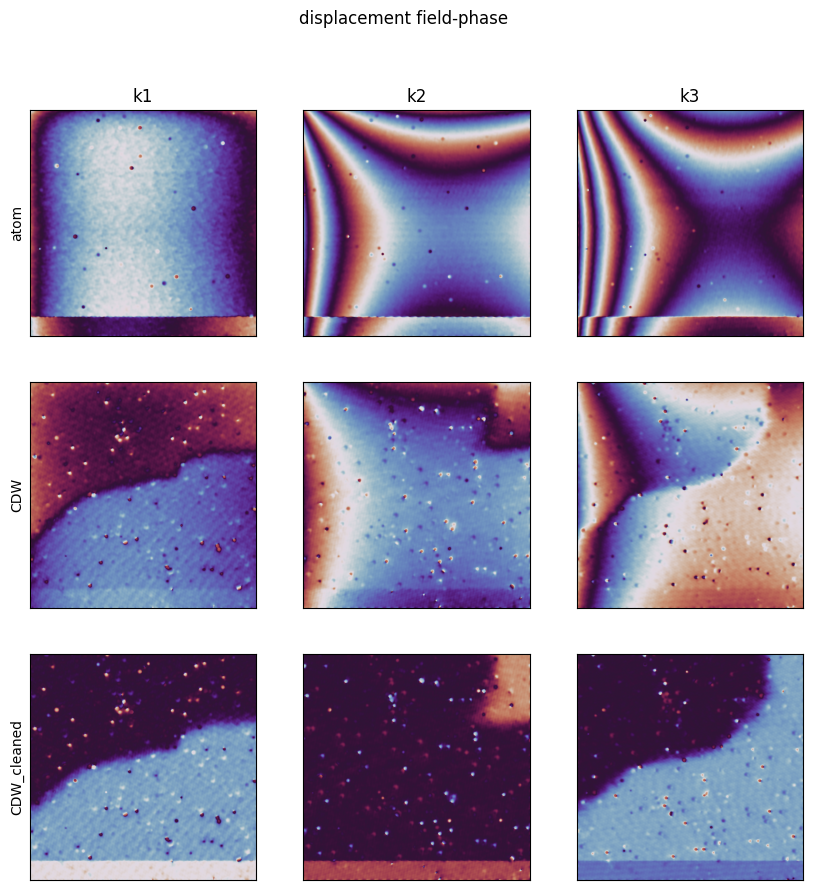

In [56]:
fig,axs = plt.subplots(3,3,figsize=(10, 10))
tns = ['k1','k2','k3']
yns = ['atom','CDW','CDW_cleaned']
for ik,tn in zip(range(3),tns):
  for iT,yn in zip(range(3),yns):
    reimg = angless_unwrapped[:,:,ik,iT]
    reimg = wrap_phase(reimg)
    axs[iT,ik].imshow(reimg, cmap='twilight')
    axs[iT,ik].set_xticks([])
    axs[iT,ik].set_yticks([])
    if iT ==0:
      axs[iT,ik].set_title(tn)
    if ik ==0:
      axs[iT,ik].set_ylabel(yn)
plt.suptitle('displacement field-phase')

tip change conpensation

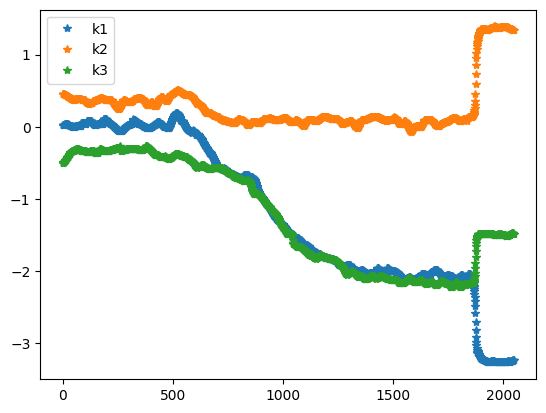

In [36]:
# iys = slice(1500,2000)
#fig,axs = plt.subplots(3,3,figsize=(15, 15))
#tns = ['k1','k2','k3']
# for ik in range(3):
#   iT = 2
#   angless_unwrapped(:,iys,ik,iT)
mean_y = angless_unwrapped[:,:,:,2].mean(axis = 1)
plt.plot(mean_y,'*',label = ['k1','k2','k3'])
plt.legend()
ax = plt.gca()
#ax.set_xlim(1500,2000)

(1500.0, 2000.0)

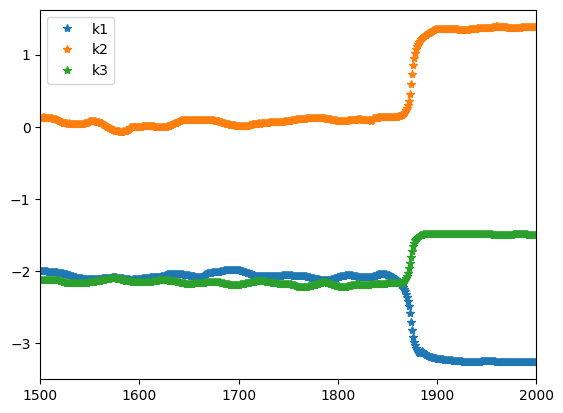

In [37]:
plt.plot(mean_y,'*',label = ['k1','k2','k3'])
plt.legend()
ax = plt.gca()
ax.set_xlim(1500,2000)

/tmp/ipython-input-38-1415406315.py:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  peaks[ik] = peaks_ + x_start


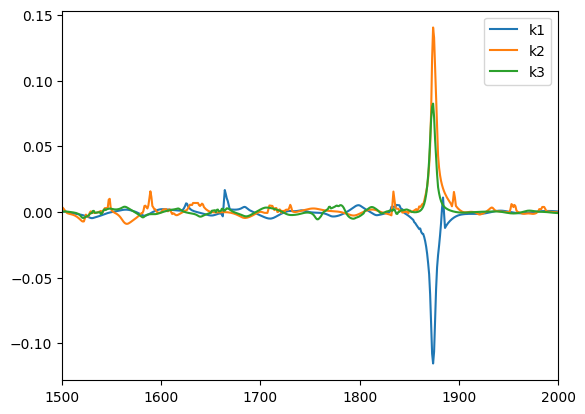

In [38]:
dmean_y = np.gradient(mean_y,axis = 0)
plt.plot(dmean_y,label = ['k1','k2','k3'])
plt.legend()
ax = plt.gca()
ax.set_xlim(1500,2000)
from scipy.signal import find_peaks
x_start, x_end = 1500, 2000
peaks = np.zeros(3)
for ik in range(3):
  peaks_, _ = find_peaks(abs(dmean_y[x_start:x_end,ik]), height=.05)
  peaks[ik] = peaks_ + x_start
# print(peaks_ + x_start)

(1500.0, 2047.0)

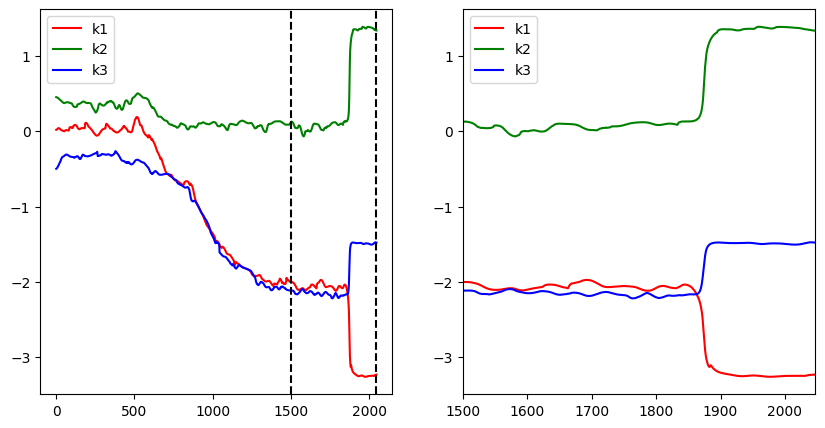

In [39]:
x_start, x_end = 1500, 2047
labels = ['k1','k2','k3']
clrs = ('r','g','b')
fig,axs = plt.subplots(1,2,figsize=(10, 5))
for iax in range(2):
  for ik in range(3):
    axs[iax].plot(mean_y[:,ik],label = labels[ik],color = clrs[ik])
    axs[iax].legend()

axs[0].axvline(x=x_start, color='k', linestyle='--')
axs[0].axvline(x=x_end, color='k', linestyle='--')
axs[1].set_xlim(x_start, x_end)

In [40]:
from scipy.optimize import curve_fit

def sigmoid(x, A, L, x0, k):
    """
    Sigmoid function with controllable parameters.

    Parameters:
    - x: Independent variable (numpy array or scalar)
    - A: Lower asymptote (step bottom)
    - L: Upper asymptote (step top)
    - x0: Midpoint (step position)
    - k: Steepness/gradient (step gradient)
    """
    return A + (L - A) / (1 + np.exp(-k * (x - x0)))


In [76]:
'a'+'b'

'ab'

/tmp/ipython-input-40-117423189.py:14: RuntimeWarning: overflow encountered in exp
  return A + (L - A) / (1 + np.exp(-k * (x - x0)))


Text(0.5, 0.98, 'visualize tip change effect')

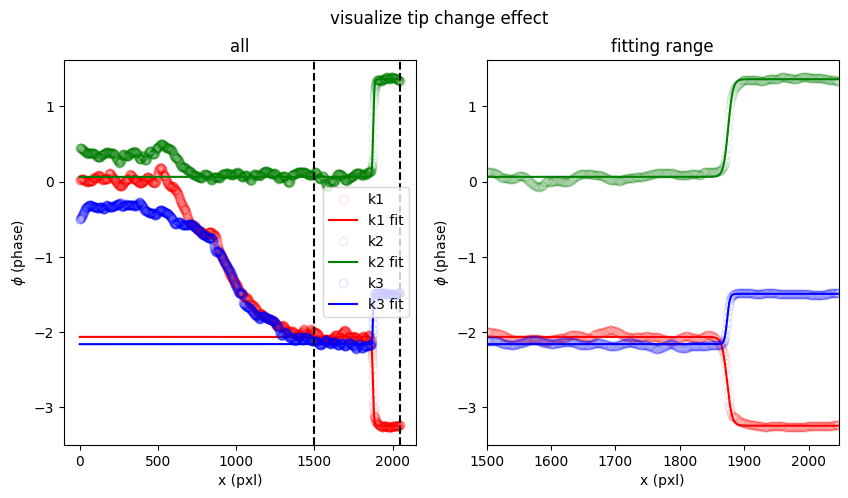

In [85]:
mean_y_roi = mean_y[x_start:x_end,ik]
x = np.arange(mean_y_roi.shape[0])
popts = []
y_compensators = [];
for ik in range(3):
  mean_y_roi = mean_y[x_start:x_end,ik]
  initial_A = np.min(mean_y_roi)
  initial_L = np.max(mean_y_roi)
  initial_x0 = 1800-x_start
  initial_k = 1.0
  p0 = [initial_A, initial_L, initial_x0, initial_k]
  try:
      # popt: Optimal parameters
      # pcov: Covariance matrix of the optimal parameters
      popt, pcov = curve_fit(sigmoid, x, mean_y_roi, p0=p0, maxfev=5000) # maxfev increases max function evaluations
  except RuntimeError as e:
      print(f"Error during curve fitting: {e}")
      print("Try adjusting initial guess (p0) or bounds, or check your data.")
      exit()
  popts.append(popt)





x = np.arange(mean_y.shape[0])
popts_ = popts
for ik in range(3):
  popts_[ik][2] = popts[ik][2] +x_start
  y_compensator = sigmoid(x, *popts_[ik])
  y_compensators.append(y_compensator)
  #plt.plot(x, sigmoid(x, *popts[ik]))


labels = ['k1','k2','k3']
clrs = ('r','g','b')
fig,axs = plt.subplots(1,2,figsize=(10, 5))
tns = ['all','fitting range']
for iax in range(2):
  axs[iax].set_title(tns[iax])


  for ik in range(3):
    axs[iax].plot(mean_y[:,ik],label = labels[ik],color = clrs[ik],linestyle='None', marker='o',markersize=6,markerfacecolor='none',alpha=0.1)
    axs[iax].plot(sigmoid(x, *popts_[ik]),label = labels[ik]+' fit',color = clrs[ik])
  axs[iax].set_xlabel('x (pxl)')
  axs[iax].set_ylabel('$\phi$ (phase)')
axs[0].legend()
axs[0].axvline(x=x_start, color='k', linestyle='--')
axs[0].axvline(x=x_end, color='k', linestyle='--')
axs[1].set_xlim(x_start, x_end)
plt.suptitle('visualize tip change effect')

In [42]:
x = np.arange(mean_y.shape[0])
x.shape

(2048,)

In [43]:
CDW_angle = angless_unwrapped[:,:,:,2].copy()
for ik in range(3):
  CDW_angle[:,:,ik] = CDW_angle[:,:,ik] - y_compensators[ik].reshape([2048,1]) + y_compensators[ik][0]


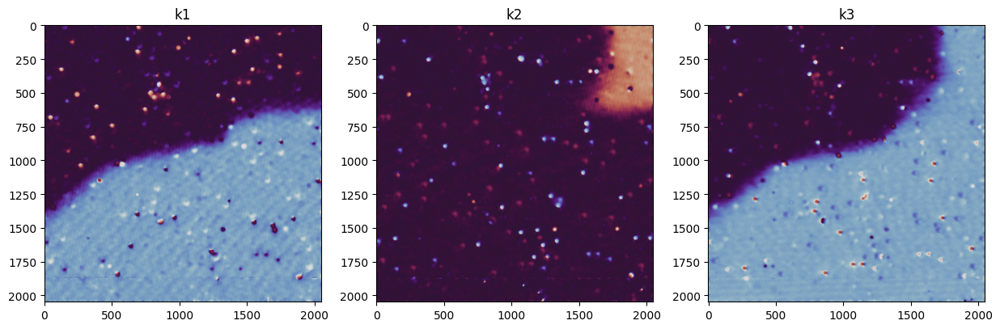

In [44]:
fig,axs = plt.subplots(1,3,figsize=(15, 15))
tns = ['k1','k2','k3']
yns = ['CDW','atom','CDW_compensate']
for ik,tn in zip(range(3),tns):
    reimg = CDW_angle[:,:,ik]
    reimg = wrap_phase(reimg)
    axs[ik].imshow(reimg, cmap='twilight')
    axs[ik].set_title(tn)